In [1]:
#*****************************************************************************************************************************
#Project   : Intelligent Path Navigator                                                                                                                                                                                               #
#Objective : The Main Objective of the project is to demonstrate the Q-Learning Model in finding the optimal path to reach   #
#the Goal State from any particular state in the Environment                                                                 #
#Approach  : 1)Design the path Grid(for Visualization)                                                                       #
#            2)Build Reward Matrix                                                                                           #
#            3)Build Q-Learning Model using Bellmen Equation(Non-Heuristic)                                                               #
#            4)Build Q-Learning Model using Heuristic Fuction                                                                #
#            5)Compare the Perfomance of Both models                                                                         #
#            6)Evaluate the Metrics of the Q-Lerning Models                                                                  #
#*****************************************************************************************************************************

In [4]:
# Importing required libraries
import pandas as pd
import random
import numpy as np
import matplotlib.pyplot as plt


   ## Grid environment where the agent is to be trained 
- There were 10 states and 1 Goal state in the grid for the agent to learn 

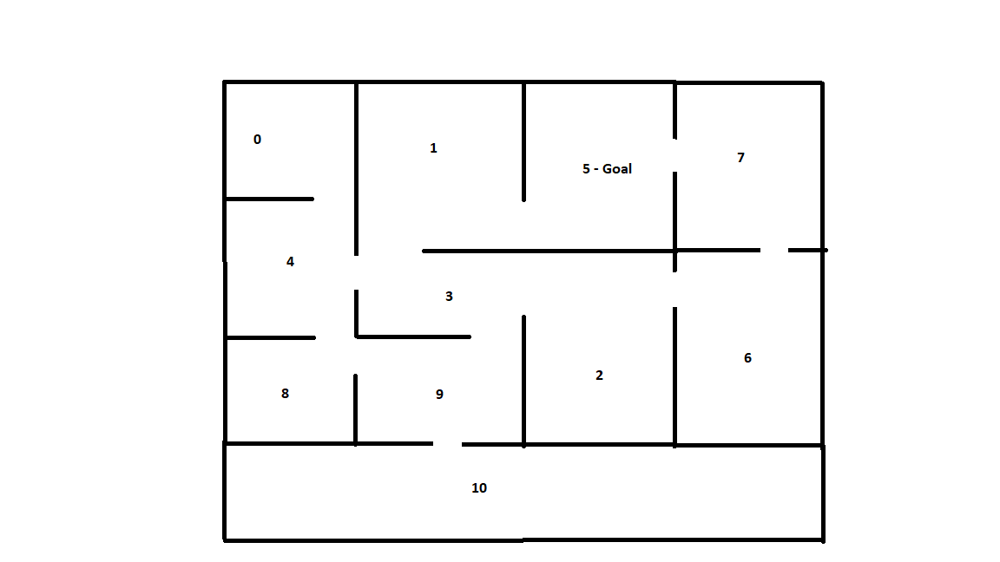

In [7]:
#Creating the reward matrix for each state and action in the grid
rewards = np.array([[-1,-1,-1,-1,0,-1,-1,-1,-1,-1,-1],
                   [-1,-1,-1,0,-1,100,-1,-1,-1,-1,-1],
                    [-1,-1,-1,0,-1,-1,0,-1,-1,-1,-1],
                    [-1,0,0,-1,0,-1,-1,-1,-1,0,-1],
                    [0,-1,-1,0,-1,-1,-1,-1,0,-1,-1],
                    [-1,0,-1,-1,-1,-1,-1,0,-1,-1,-1],
                    [-1,-1,0,-1,-1,-1,-1,0,-1,-1,-1],
                    [-1,-1,-1,-1,-1,0,0,-1,-1,-1,-1],
                    [-1,-1,-1,-1,0,-1,-1,-1,-1,0,-1],
                    [-1,-1,-1,0,-1,-1,-1,-1,0,-1,0],
                    [-1,-1,-1,-1,-1,-1,-1,-1,-1,0,-1]])

pd.DataFrame(rewards)

,0,1,2,3,4,5,6,7,8,9,10
0,-1,-1,-1,-1,0,-1,-1,-1,-1,-1,-1
1,-1,-1,-1,0,-1,100,-1,-1,-1,-1,-1
2,-1,-1,-1,0,-1,-1,0,-1,-1,-1,-1
3,-1,0,0,-1,0,-1,-1,-1,-1,0,-1
4,0,-1,-1,0,-1,-1,-1,-1,0,-1,-1
5,-1,0,-1,-1,-1,-1,-1,0,-1,-1,-1
6,-1,-1,0,-1,-1,-1,-1,0,-1,-1,-1
7,-1,-1,-1,-1,-1,0,0,-1,-1,-1,-1
8,-1,-1,-1,-1,0,-1,-1,-1,-1,0,-1
9,-1,-1,-1,0,-1,-1,-1,-1,0,-1,0


In [27]:
# Initialising the q-matrix with zeroes
def init_q_matrix(m,n):
    return np.zeros((m,n))

q_matrix = init_q_matrix(11,11)
pd.DataFrame(q_matrix)

,0,1,2,3,4,5,6,7,8,9,10
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:
def set_init_state(rooms = 11):
    return np.random.randint(0,rooms)

In [29]:
def normalize_q_matrix(q_matrix):
    normalized_q = q_matrix/max(q_matrix[q_matrix.nonzero()]) * 100
    return normalized_q.astype(int)

## Simple Q-Learning Model Building to reach Goal State(i.e. 5)

In [30]:
def train_agent(episode):
    time_step = 0
    gamma=0.8
    
    current_state = set_init_state()

    while True:
        valid_actions = []
        for action in enumerate(rewards[current_state]):
            if action[1]!= -1:
                valid_actions +=[action[0]]
        action = random.choice(valid_actions)
        cur_state_reward= rewards[current_state, action] 
        nxt_state_reward= max(q_matrix[action,])
        q_current_state= cur_state_reward+(gamma*nxt_state_reward)
        q_matrix[current_state, action]=q_current_state 
        new_state= action
        print(q_matrix)
        print(f"Old State: {current_state} | New State: {new_state}\n\n")
        current_state = new_state
        time_step = time_step +1

        if new_state== 5:
            print(f"Agent has reached it's goal!")
            print(f"The Total Timesteps took by Agent for this episode {episode} is",time_step)
            break
    return time_step,q_matrix

In [31]:
# Full training for the Agent
total_steps = 0
iterations = 500
learning_step_bi = []
rewards_curve_bi = []
for episode in range(1,iterations):
    steps,q_matrix = train_agent(episode) 
    rewards_curve_bi.append(np.sum(q_matrix))
    learning_step_bi.append(total_steps + steps)
    total_steps = total_steps + steps
print("Total Number of Steps for full learning Process:",total_steps)

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Old State: 0 | New State: 4


[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Old State: 4 | New State: 8


[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [

    0.  ]]
Old State: 6 | New State: 2


[[  0.     0.     0.     0.    51.2    0.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.    64.     0.   100.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.    64.     0.     0.     0.     0.     0.     0.
    0.  ]
 [  0.    80.     0.     0.    51.2    0.     0.     0.     0.     0.
    0.  ]
 [ 40.96   0.     0.    64.     0.     0.     0.     0.    40.96   0.
    0.  ]
 [  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.     0.    51.2    0.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
    0.  ]]
Old State: 2 | New State: 3


[[  0.     0.     0.     0.    51.2    0.     0.

    0.  ]]
Old State: 7 | New State: 5


Agent has reached it's goal!
The Total Timesteps took by Agent for this episode 7 is 50
[[  0.     0.     0.     0.    51.2    0.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.    64.     0.   100.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.    64.     0.     0.    40.96   0.     0.     0.
    0.  ]
 [  0.    80.    51.2    0.    51.2    0.     0.     0.     0.    51.2
    0.  ]
 [ 40.96   0.     0.    64.     0.     0.     0.     0.    40.96   0.
    0.  ]
 [  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
    0.  ]
 [  0.     0.    51.2    0.     0.     0.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.     0.    51.2    0.     0.     0.     0.    51.2
    0.  ]
 [  0.     0.     0.    64.     0.     0.     0.     0.    40.96   0.
   40.96]
 [  0.     0.     0.     0.     0.     0.     0.     0.     0.    51.

    0.        0.       83.968     0.     ]]
Old State: 4 | New State: 0


[[  0.        0.        0.        0.       83.968     0.        0.
    0.        0.        0.        0.     ]
 [  0.        0.        0.      104.96      0.      164.        0.
    0.        0.        0.        0.     ]
 [  0.        0.        0.      104.96      0.        0.       67.1744
    0.        0.        0.        0.     ]
 [  0.      131.2      83.968     0.       53.73952   0.        0.
    0.        0.       83.968     0.     ]
 [ 67.1744    0.        0.      104.96      0.        0.        0.
    0.       67.1744    0.        0.     ]
 [  0.       80.        0.        0.        0.        0.        0.
    0.        0.        0.        0.     ]
 [  0.        0.       83.968     0.        0.        0.        0.
   53.73952   0.        0.        0.     ]
 [  0.        0.        0.        0.        0.       64.       67.1744
    0.        0.        0.        0.     ]
 [  0.        0.        0.        0.  

    0.         0.         0.        83.968      0.      ]]
Old State: 4 | New State: 0


[[  0.         0.         0.         0.       104.93952    0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.       204.96
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       104.96       0.         0.
   67.1744     0.         0.         0.         0.      ]
 [  0.       163.968     83.968      0.       104.93952    0.
    0.         0.         0.        83.968      0.      ]
 [ 83.951616   0.         0.       131.1744     0.         0.
    0.         0.        67.1744     0.         0.      ]
 [  0.       131.2        0.         0.         0.         0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.        83.968      0.         0.         0.
    0.        53.73952    0.         0.         0.      ]
 [  0.         0.         0.         0.         0.       104.96
   67

    0.         0.         0.       104.93952    0.      ]]
Old State: 4 | New State: 0


[[  0.         0.         0.         0.       104.93952    0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.       204.96
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.         0.
   83.951616   0.         0.         0.         0.      ]
 [  0.       163.968    104.93952    0.       104.93952    0.
    0.         0.         0.       104.93952    0.      ]
 [ 83.951616   0.         0.       131.1744     0.         0.
    0.         0.        83.951616   0.         0.      ]
 [  0.       131.2        0.         0.         0.         0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.       104.93952    0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.         0.         0.         0.       104.96
   67

    0.         0.         0.       104.93952    0.      ]]
Old State: 3 | New State: 1


[[  0.         0.         0.         0.       104.93952    0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.       204.96
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.         0.
   83.951616   0.         0.         0.         0.      ]
 [  0.       163.968    104.93952    0.       104.93952    0.
    0.         0.         0.       104.93952    0.      ]
 [ 83.951616   0.         0.       131.1744     0.         0.
    0.         0.        83.951616   0.         0.      ]
 [  0.       131.2        0.         0.         0.         0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.       104.93952    0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.         0.         0.         0.       104.96
   83

    0.         0.         0.       104.93952    0.      ]]
Old State: 4 | New State: 8


[[  0.         0.         0.         0.       104.93952    0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.       204.96
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.         0.
   83.951616   0.         0.         0.         0.      ]
 [  0.       163.968    104.93952    0.       104.93952    0.
    0.         0.         0.       104.93952    0.      ]
 [ 83.951616   0.         0.       131.1744     0.         0.
    0.         0.        83.951616   0.         0.      ]
 [  0.       131.2        0.         0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.       104.93952    0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.         0.         0.         0.       104.96
   83

    0.         0.         0.       104.93952    0.      ]]
Old State: 5 | New State: 7


[[  0.         0.         0.         0.       104.93952    0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.       204.96
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.         0.
   83.951616   0.         0.         0.         0.      ]
 [  0.       163.968    104.93952    0.       104.93952    0.
    0.         0.         0.       104.93952    0.      ]
 [ 83.951616   0.         0.       131.1744     0.         0.
    0.         0.        83.951616   0.         0.      ]
 [  0.       131.2        0.         0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.       104.93952    0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.         0.         0.         0.       104.96
   83

    0.         0.         0.       104.93952    0.      ]]
Old State: 0 | New State: 4


[[  0.         0.         0.         0.       104.93952    0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       147.951616   0.       231.1744
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.         0.
   83.951616   0.         0.         0.         0.      ]
 [  0.       184.93952  104.93952    0.       104.93952    0.
    0.         0.         0.       104.93952    0.      ]
 [ 83.951616   0.         0.       131.1744     0.         0.
    0.         0.        83.951616   0.         0.      ]
 [  0.       163.968      0.         0.         0.         0.
    0.       104.93952    0.         0.         0.      ]
 [  0.         0.       104.93952    0.         0.         0.
    0.       104.93952    0.         0.         0.      ]
 [  0.         0.         0.         0.         0.       131.1744
 

    0.        ]]
Old State: 1 | New State: 3


[[  0.           0.           0.           0.         126.95122739
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         158.68903424   0.
  247.951616     0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         158.68903424   0.
    0.          83.951616     0.           0.           0.
    0.        ]
 [  0.         198.3612928  118.3612928    0.         126.95122739
    0.           0.           0.           0.         118.3612928
    0.        ]
 [101.56098191   0.           0.         158.68903424   0.
    0.           0.           0.          94.68903424   0.
    0.        ]
 [  0.         184.93952      0.           0.           0.
    0.           0.         118.3612928    0.           0.
    0.        ]
 [  0.           0.         118.3612928    0.           0.
    0.           0.         104.93952      0.           0.
    0.  

    0.        ]]
Old State: 3 | New State: 1


[[  0.           0.           0.           0.         126.95122739
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         158.68903424   0.
  247.951616     0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         158.68903424   0.
    0.          83.951616     0.           0.           0.
    0.        ]
 [  0.         198.3612928  126.95122739   0.         126.95122739
    0.           0.           0.           0.         126.95122739
    0.        ]
 [101.56098191   0.           0.         158.68903424   0.
    0.           0.           0.         101.56098191   0.
    0.        ]
 [  0.         184.93952      0.           0.           0.
    0.           0.         118.3612928    0.           0.
    0.        ]
 [  0.           0.         118.3612928    0.           0.
    0.           0.         104.93952      0.           0.
    0. 

    0.        ]]
Old State: 8 | New State: 9


[[  0.           0.           0.           0.         132.44878553
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         158.68903424   0.
  258.68903424   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         158.68903424   0.
    0.          94.68903424   0.           0.           0.
    0.        ]
 [  0.         206.95122739 126.95122739   0.         132.44878553
    0.           0.           0.           0.         126.95122739
    0.        ]
 [105.95902842   0.           0.         165.56098191   0.
    0.           0.           0.         105.95902842   0.
    0.        ]
 [  0.         198.3612928    0.           0.           0.
    0.           0.         118.3612928    0.           0.
    0.        ]
 [  0.           0.         118.3612928    0.           0.
    0.           0.         126.95122739   0.           0.
    0. 

    0.        ]]
Old State: 9 | New State: 8


[[  0.           0.           0.           0.         132.44878553
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         158.68903424   0.
  258.68903424   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         165.56098191   0.
    0.         101.56098191   0.           0.           0.
    0.        ]
 [  0.         206.95122739 132.44878553   0.         132.44878553
    0.           0.           0.           0.         132.44878553
    0.        ]
 [105.95902842   0.           0.         165.56098191   0.
    0.           0.           0.         105.95902842   0.
    0.        ]
 [  0.         198.3612928    0.           0.           0.
    0.           0.         126.95122739   0.           0.
    0.        ]
 [  0.           0.         132.44878553   0.           0.
    0.           0.         126.95122739   0.           0.
    0. 

    0.        ]]
Old State: 1 | New State: 3


[[  0.           0.           0.           0.         132.44878553
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         165.56098191   0.
  258.68903424   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         165.56098191   0.
    0.         105.95902842   0.           0.           0.
    0.        ]
 [  0.         206.95122739 132.44878553   0.         132.44878553
    0.           0.           0.           0.         132.44878553
    0.        ]
 [105.95902842   0.           0.         165.56098191   0.
    0.           0.           0.         105.95902842   0.
    0.        ]
 [  0.         198.3612928    0.           0.           0.
    0.           0.         126.95122739   0.           0.
    0.        ]
 [  0.           0.         132.44878553   0.           0.
    0.           0.         126.95122739   0.           0.
    0. 

    0.        ]]
Old State: 2 | New State: 6


[[  0.           0.           0.           0.         132.44878553
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         165.56098191   0.
  258.68903424   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         165.56098191   0.
    0.         105.95902842   0.           0.           0.
    0.        ]
 [  0.         206.95122739 132.44878553   0.         132.44878553
    0.           0.           0.           0.         132.44878553
    0.        ]
 [105.95902842   0.           0.         165.56098191   0.
    0.           0.           0.         105.95902842   0.
    0.        ]
 [  0.         198.3612928    0.           0.           0.
    0.           0.         126.95122739   0.           0.
    0.        ]
 [  0.           0.         132.44878553   0.           0.
    0.           0.         126.95122739   0.           0.
    0. 

    0.        ]]
Old State: 9 | New State: 3


[[  0.           0.           0.           0.         132.44878553
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         165.56098191   0.
  258.68903424   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         165.56098191   0.
    0.         105.95902842   0.           0.           0.
    0.        ]
 [  0.         206.95122739 132.44878553   0.         132.44878553
    0.           0.           0.           0.         132.44878553
    0.        ]
 [105.95902842   0.           0.         165.56098191   0.
    0.           0.           0.         105.95902842   0.
    0.        ]
 [  0.         198.3612928    0.           0.           0.
    0.           0.         126.95122739   0.           0.
    0.        ]
 [  0.           0.         132.44878553   0.           0.
    0.           0.         126.95122739   0.           0.
    0. 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Old State: 3 | New State: 4


[[  0.           0.           0.           0.         138.21902255
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         172.77377819   0.
  269.95902842   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         172.77377819   0.
    0.         105.95902842   0.           0.           0.
    0.        ]
 [  0.         215.96722274 138.21902255   0.         138.21902255
    0.           0.           0.           0.         138.21902255
    0.        ]
 [110.57521804   0.           0.         172.77377819   0.
    0.           0.           0.         110.57521804   0.
    0.        ]
 [  0.         212.44878553   0.           0.           0.
    0.           0.         126.95122739   0.           0.
    0.        ]
 [  0.           0.         132.44878553   0.           0.
    0.           0.         135.96722274   0.           0.
    0.        ]
 [  0. 

    0.        ]]
Old State: 2 | New State: 3


[[  0.           0.           0.           0.         138.21902255
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         172.77377819   0.
  269.95902842   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         172.77377819   0.
    0.         110.57521804   0.           0.           0.
    0.        ]
 [  0.         215.96722274 138.21902255   0.         138.21902255
    0.           0.           0.           0.         138.21902255
    0.        ]
 [110.57521804   0.           0.         172.77377819   0.
    0.           0.           0.         110.57521804   0.
    0.        ]
 [  0.         212.44878553   0.           0.           0.
    0.           0.         126.95122739   0.           0.
    0.        ]
 [  0.           0.         138.21902255   0.           0.
    0.           0.         135.96722274   0.           0.
    0. 

    0.        ]]
Old State: 0 | New State: 4


[[  0.           0.           0.           0.         138.21902255
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         172.77377819   0.
  269.95902842   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         172.77377819   0.
    0.         110.57521804   0.           0.           0.
    0.        ]
 [  0.         215.96722274 138.21902255   0.         138.21902255
    0.           0.           0.           0.         138.21902255
    0.        ]
 [110.57521804   0.           0.         172.77377819   0.
    0.           0.           0.         110.57521804   0.
    0.        ]
 [  0.         212.44878553   0.           0.           0.
    0.           0.         126.95122739   0.           0.
    0.        ]
 [  0.           0.         138.21902255   0.           0.
    0.           0.         135.96722274   0.           0.
    0. 

    0.        ]]
Old State: 10 | New State: 9


[[  0.           0.           0.           0.         138.21902255
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         174.57521804   0.
  272.77377819   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         174.57521804   0.
    0.         110.57521804   0.           0.           0.
    0.        ]
 [  0.         218.21902255 139.66017443   0.         139.66017443
    0.           0.           0.           0.         138.21902255
    0.        ]
 [110.57521804   0.           0.         174.57521804   0.
    0.           0.           0.         111.72813955   0.
    0.        ]
 [  0.         218.21902255   0.           0.           0.
    0.           0.         135.96722274   0.           0.
    0.        ]
 [  0.           0.         138.21902255   0.           0.
    0.           0.         138.21902255   0.           0.
    0.

Old State: 4 | New State: 0


[[  0.           0.           0.           0.         140.58251164
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         175.72813955   0.
  274.57521804   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         175.72813955   0.
    0.         111.72813955   0.           0.           0.
    0.        ]
 [  0.         219.66017443 140.58251164   0.         140.58251164
    0.           0.           0.           0.         140.58251164
    0.        ]
 [112.46600931   0.           0.         175.72813955   0.
    0.           0.           0.         112.46600931   0.
    0.        ]
 [  0.         218.21902255   0.           0.           0.
    0.           0.         135.96722274   0.           0.
    0.        ]
 [  0.           0.         139.66017443   0.           0.
    0.           0.         139.66017443   0.           0.
    0.        ]
 [  0.  

    0.        ]]
Old State: 3 | New State: 4


[[  0.           0.           0.           0.         140.58251164
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
  275.72813955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         175.72813955   0.
    0.         111.72813955   0.           0.           0.
    0.        ]
 [  0.         220.58251164 140.58251164   0.         140.58251164
    0.           0.           0.           0.         140.58251164
    0.        ]
 [112.46600931   0.           0.         175.72813955   0.
    0.           0.           0.         112.46600931   0.
    0.        ]
 [  0.         219.66017443   0.           0.           0.
    0.           0.         135.96722274   0.           0.
    0.        ]
 [  0.           0.         139.66017443   0.           0.
    0.           0.         139.66017443   0.           0.
    0. 

    0.        ]]
Old State: 4 | New State: 0


[[  0.           0.           0.           0.         141.17280745
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
  275.72813955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
    0.         112.93824596   0.           0.           0.
    0.        ]
 [  0.         220.58251164 141.17280745   0.         141.17280745
    0.           0.           0.           0.         141.17280745
    0.        ]
 [112.93824596   0.           0.         176.46600931   0.
    0.           0.           0.         112.93824596   0.
    0.        ]
 [  0.         219.66017443   0.           0.           0.
    0.           0.         135.96722274   0.           0.
    0.        ]
 [  0.           0.         141.17280745   0.           0.
    0.           0.         140.58251164   0.           0.
    0. 

    0.        ]]
Old State: 3 | New State: 2


[[  0.           0.           0.           0.         141.17280745
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
  275.72813955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
    0.         112.93824596   0.           0.           0.
    0.        ]
 [  0.         220.58251164 141.17280745   0.         141.17280745
    0.           0.           0.           0.         141.17280745
    0.        ]
 [112.93824596   0.           0.         176.46600931   0.
    0.           0.           0.         112.93824596   0.
    0.        ]
 [  0.         219.66017443   0.           0.           0.
    0.           0.         140.58251164   0.           0.
    0.        ]
 [  0.           0.         141.17280745   0.           0.
    0.           0.         140.58251164   0.           0.
    0. 

    0.        ]]
Old State: 3 | New State: 9


[[  0.           0.           0.           0.         141.17280745
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
  275.72813955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
    0.         112.93824596   0.           0.           0.
    0.        ]
 [  0.         220.58251164 141.17280745   0.         141.17280745
    0.           0.           0.           0.         141.17280745
    0.        ]
 [112.93824596   0.           0.         176.46600931   0.
    0.           0.           0.         112.93824596   0.
    0.        ]
 [  0.         219.66017443   0.           0.           0.
    0.           0.         140.58251164   0.           0.
    0.        ]
 [  0.           0.         141.17280745   0.           0.
    0.           0.         140.58251164   0.           0.
    0. 

    0.        ]]
Old State: 8 | New State: 9


[[  0.           0.           0.           0.         141.17280745
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
  275.72813955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
    0.         112.93824596   0.           0.           0.
    0.        ]
 [  0.         220.58251164 141.17280745   0.         141.17280745
    0.           0.           0.           0.         141.17280745
    0.        ]
 [112.93824596   0.           0.         176.46600931   0.
    0.           0.           0.         112.93824596   0.
    0.        ]
 [  0.         219.66017443   0.           0.           0.
    0.           0.         140.58251164   0.           0.
    0.        ]
 [  0.           0.         141.17280745   0.           0.
    0.           0.         140.58251164   0.           0.
    0. 

    0.        ]]
Old State: 3 | New State: 4


[[  0.           0.           0.           0.         141.17280745
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
  275.72813955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
    0.         112.93824596   0.           0.           0.
    0.        ]
 [  0.         220.58251164 141.17280745   0.         141.17280745
    0.           0.           0.           0.         141.17280745
    0.        ]
 [112.93824596   0.           0.         176.46600931   0.
    0.           0.           0.         112.93824596   0.
    0.        ]
 [  0.         219.66017443   0.           0.           0.
    0.           0.         140.58251164   0.           0.
    0.        ]
 [  0.           0.         141.17280745   0.           0.
    0.           0.         140.58251164   0.           0.
    0. 

    0.        ]]
Old State: 4 | New State: 3


[[  0.           0.           0.           0.         141.17280745
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
  275.72813955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
    0.         112.93824596   0.           0.           0.
    0.        ]
 [  0.         220.58251164 141.17280745   0.         141.17280745
    0.           0.           0.           0.         141.17280745
    0.        ]
 [112.93824596   0.           0.         176.46600931   0.
    0.           0.           0.         112.93824596   0.
    0.        ]
 [  0.         220.58251164   0.           0.           0.
    0.           0.         140.58251164   0.           0.
    0.        ]
 [  0.           0.         141.17280745   0.           0.
    0.           0.         140.58251164   0.           0.
    0. 

    0.        ]]
Old State: 6 | New State: 7


[[  0.           0.           0.           0.         141.17280745
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.93824596   0.
  276.93824596   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.93824596   0.
    0.         113.24047741   0.           0.           0.
    0.        ]
 [  0.         221.17280745 141.55059677   0.         141.55059677
    0.           0.           0.           0.         141.55059677
    0.        ]
 [112.93824596   0.           0.         176.93824596   0.
    0.           0.           0.         112.93824596   0.
    0.        ]
 [  0.         221.17280745   0.           0.           0.
    0.           0.         141.17280745   0.           0.
    0.        ]
 [  0.           0.         141.55059677   0.           0.
    0.           0.         141.17280745   0.           0.
    0. 

    0.        ]]
Old State: 9 | New State: 8


[[  0.           0.           0.           0.         141.79238193
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
  276.93824596   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
    0.         113.43390554   0.           0.           0.
    0.        ]
 [  0.         221.55059677 141.79238193   0.         141.79238193
    0.           0.           0.           0.         141.79238193
    0.        ]
 [113.43390554   0.           0.         177.24047741   0.
    0.           0.           0.         113.43390554   0.
    0.        ]
 [  0.         221.17280745   0.           0.           0.
    0.           0.         141.17280745   0.           0.
    0.        ]
 [  0.           0.         141.79238193   0.           0.
    0.           0.         141.55059677   0.           0.
    0. 

    0.        ]]
Old State: 1 | New State: 3


[[  0.           0.           0.           0.         141.79238193
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
  276.93824596   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
    0.         113.43390554   0.           0.           0.
    0.        ]
 [  0.         221.55059677 141.79238193   0.         141.79238193
    0.           0.           0.           0.         141.79238193
    0.        ]
 [113.43390554   0.           0.         177.24047741   0.
    0.           0.           0.         113.43390554   0.
    0.        ]
 [  0.         221.17280745   0.           0.           0.
    0.           0.         141.17280745   0.           0.
    0.        ]
 [  0.           0.         141.79238193   0.           0.
    0.           0.         141.55059677   0.           0.
    0. 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Old State: 3 | New State: 9


[[  0.           0.           0.           0.         141.79238193
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
  276.93824596   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
    0.         113.43390554   0.           0.           0.
    0.        ]
 [  0.         221.55059677 141.79238193   0.         141.79238193
    0.           0.           0.           0.         141.79238193
    0.        ]
 [113.43390554   0.           0.         177.24047741   0.
    0.           0.           0.         113.43390554   0.
    0.        ]
 [  0.         221.17280745   0.           0.           0.
    0.           0.         141.55059677   0.           0.
    0.        ]
 [  0.           0.         141.79238193   0.           0.
    0.           0.         141.55059677   0.           0.
    0.        ]
 [  0. 

[[  0.           0.           0.           0.         141.79238193
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
  276.93824596   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
    0.         113.43390554   0.           0.           0.
    0.        ]
 [  0.         221.55059677 141.79238193   0.         141.79238193
    0.           0.           0.           0.         141.79238193
    0.        ]
 [113.43390554   0.           0.         177.24047741   0.
    0.           0.           0.         113.43390554   0.
    0.        ]
 [  0.         221.17280745   0.           0.           0.
    0.           0.         141.55059677   0.           0.
    0.        ]
 [  0.           0.         141.79238193   0.           0.
    0.           0.         141.55059677   0.           0.
    0.        ]
 [  0.           0.           0.      

    0.        ]]
Old State: 3 | New State: 1


[[  0.           0.           0.           0.         141.79238193
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
  276.93824596   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
    0.         113.43390554   0.           0.           0.
    0.        ]
 [  0.         221.55059677 141.79238193   0.         141.79238193
    0.           0.           0.           0.         141.79238193
    0.        ]
 [113.43390554   0.           0.         177.24047741   0.
    0.           0.           0.         113.43390554   0.
    0.        ]
 [  0.         221.17280745   0.           0.           0.
    0.           0.         141.55059677   0.           0.
    0.        ]
 [  0.           0.         141.79238193   0.           0.
    0.           0.         141.55059677   0.           0.
    0. 

    0.        ]]
Old State: 6 | New State: 7


[[  0.           0.           0.           0.         141.94712444
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.43390554   0.
  277.24047741   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.43390554   0.
    0.         113.55769955   0.           0.           0.
    0.        ]
 [  0.         221.79238193 141.79238193   0.         141.94712444
    0.           0.           0.           0.         141.94712444
    0.        ]
 [113.55769955   0.           0.         177.43390554   0.
    0.           0.           0.         113.55769955   0.
    0.        ]
 [  0.         221.55059677   0.           0.           0.
    0.           0.         141.55059677   0.           0.
    0.        ]
 [  0.           0.         141.94712444   0.           0.
    0.           0.         141.79238193   0.           0.
    0. 


[[  0.           0.           0.           0.         141.94712444
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.43390554   0.
  277.24047741   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.43390554   0.
    0.         113.55769955   0.           0.           0.
    0.        ]
 [  0.         221.79238193 141.94712444   0.         141.94712444
    0.           0.           0.           0.         141.94712444
    0.        ]
 [113.55769955   0.           0.         177.43390554   0.
    0.           0.           0.         113.55769955   0.
    0.        ]
 [  0.         221.55059677   0.           0.           0.
    0.           0.         141.55059677   0.           0.
    0.        ]
 [  0.           0.         141.94712444   0.           0.
    0.           0.         141.79238193   0.           0.
    0.        ]
 [  0.           0.           0.     

    0.        ]]
Old State: 0 | New State: 4


[[  0.           0.           0.           0.         141.94712444
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.43390554   0.
  277.24047741   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.43390554   0.
    0.         113.55769955   0.           0.           0.
    0.        ]
 [  0.         221.79238193 141.94712444   0.         141.94712444
    0.           0.           0.           0.         141.94712444
    0.        ]
 [113.55769955   0.           0.         177.43390554   0.
    0.           0.           0.         113.55769955   0.
    0.        ]
 [  0.         221.55059677   0.           0.           0.
    0.           0.         141.55059677   0.           0.
    0.        ]
 [  0.           0.         141.94712444   0.           0.
    0.           0.         141.79238193   0.           0.
    0. 

    0.        ]]
Old State: 4 | New State: 0


[[  0.           0.           0.           0.         141.94712444
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.43390554   0.
  277.24047741   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.43390554   0.
    0.         113.55769955   0.           0.           0.
    0.        ]
 [  0.         221.79238193 141.94712444   0.         141.94712444
    0.           0.           0.           0.         141.94712444
    0.        ]
 [113.55769955   0.           0.         177.43390554   0.
    0.           0.           0.         113.55769955   0.
    0.        ]
 [  0.         221.55059677   0.           0.           0.
    0.           0.         141.79238193   0.           0.
    0.        ]
 [  0.           0.         141.94712444   0.           0.
    0.           0.         141.79238193   0.           0.
    0. 

    0.        ]]
Old State: 3 | New State: 1


[[  0.           0.           0.           0.         141.94712444
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.43390554   0.
  277.24047741   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.43390554   0.
    0.         113.55769955   0.           0.           0.
    0.        ]
 [  0.         221.79238193 141.94712444   0.         141.94712444
    0.           0.           0.           0.         141.94712444
    0.        ]
 [113.55769955   0.           0.         177.43390554   0.
    0.           0.           0.         113.55769955   0.
    0.        ]
 [  0.         221.55059677   0.           0.           0.
    0.           0.         141.79238193   0.           0.
    0.        ]
 [  0.           0.         141.94712444   0.           0.
    0.           0.         141.79238193   0.           0.
    0. 

    0.        ]]
Old State: 7 | New State: 5


Agent has reached it's goal!
The Total Timesteps took by Agent for this episode 295 is 10
[[  0.           0.           0.           0.         141.94712444
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.43390554   0.
  277.24047741   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.43390554   0.
    0.         113.55769955   0.           0.           0.
    0.        ]
 [  0.         221.79238193 141.94712444   0.         141.94712444
    0.           0.           0.           0.         141.94712444
    0.        ]
 [113.55769955   0.           0.         177.43390554   0.
    0.           0.           0.         113.55769955   0.
    0.        ]
 [  0.         221.55059677   0.           0.           0.
    0.           0.         141.79238193   0.           0.
    0.        ]
 [  0.           0.         141.947

    0.        ]]
Old State: 10 | New State: 9


[[  0.           0.           0.           0.         142.04615964
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.55769955   0.
  277.43390554   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.55769955   0.
    0.         113.55769955   0.           0.           0.
    0.        ]
 [  0.         221.94712444 142.04615964   0.         142.04615964
    0.           0.           0.           0.         142.04615964
    0.        ]
 [113.63692771   0.           0.         177.55769955   0.
    0.           0.           0.         113.63692771   0.
    0.        ]
 [  0.         221.94712444   0.           0.           0.
    0.           0.         141.79238193   0.           0.
    0.        ]
 [  0.           0.         141.94712444   0.           0.
    0.           0.         141.79238193   0.           0.
    0.

    0.        ]]
Old State: 9 | New State: 3


[[  0.           0.           0.           0.         142.10954217
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.55769955   0.
  277.55769955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.63692771   0.
    0.         113.68763374   0.           0.           0.
    0.        ]
 [  0.         222.04615964 142.10954217   0.         142.10954217
    0.           0.           0.           0.         142.10954217
    0.        ]
 [113.68763374   0.           0.         177.63692771   0.
    0.           0.           0.         113.68763374   0.
    0.        ]
 [  0.         221.94712444   0.           0.           0.
    0.           0.         141.79238193   0.           0.
    0.        ]
 [  0.           0.         142.10954217   0.           0.
    0.           0.         142.04615964   0.           0.
    0. 

[[  0.           0.           0.           0.         142.10954217
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.63692771   0.
  277.55769955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.63692771   0.
    0.         113.68763374   0.           0.           0.
    0.        ]
 [  0.         222.04615964 142.10954217   0.         142.10954217
    0.           0.           0.           0.         142.10954217
    0.        ]
 [113.68763374   0.           0.         177.63692771   0.
    0.           0.           0.         113.68763374   0.
    0.        ]
 [  0.         222.04615964   0.           0.           0.
    0.           0.         141.79238193   0.           0.
    0.        ]
 [  0.           0.         142.10954217   0.           0.
    0.           0.         142.04615964   0.           0.
    0.        ]
 [  0.           0.           0.      

    0.        ]]
Old State: 2 | New State: 6


[[  0.           0.           0.           0.         142.17606847
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.72008559   0.
  277.68763374   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.72008559   0.
    0.         113.72008559   0.           0.           0.
    0.        ]
 [  0.         222.15010699 142.17606847   0.         142.17606847
    0.           0.           0.           0.         142.10954217
    0.        ]
 [113.74085478   0.           0.         177.72008559   0.
    0.           0.           0.         113.68763374   0.
    0.        ]
 [  0.         222.10954217   0.           0.           0.
    0.           0.         142.15010699   0.           0.
    0.        ]
 [  0.           0.         142.17606847   0.           0.
    0.           0.         142.15010699   0.           0.
    0. 

    0.        ]]
Old State: 9 | New State: 10


[[  0.           0.           0.           0.         142.17606847
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.72008559   0.
  277.68763374   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.72008559   0.
    0.         113.74085478   0.           0.           0.
    0.        ]
 [  0.         222.15010699 142.17606847   0.         142.17606847
    0.           0.           0.           0.         142.17606847
    0.        ]
 [113.74085478   0.           0.         177.72008559   0.
    0.           0.           0.         113.74085478   0.
    0.        ]
 [  0.         222.10954217   0.           0.           0.
    0.           0.         142.15010699   0.           0.
    0.        ]
 [  0.           0.         142.17606847   0.           0.
    0.           0.         142.15010699   0.           0.
    0.

    0.        ]]
Old State: 10 | New State: 9


[[  0.           0.           0.           0.         142.17606847
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.72008559   0.
  277.68763374   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.72008559   0.
    0.         113.74085478   0.           0.           0.
    0.        ]
 [  0.         222.15010699 142.17606847   0.         142.17606847
    0.           0.           0.           0.         142.17606847
    0.        ]
 [113.74085478   0.           0.         177.72008559   0.
    0.           0.           0.         113.74085478   0.
    0.        ]
 [  0.         222.10954217   0.           0.           0.
    0.           0.         142.15010699   0.           0.
    0.        ]
 [  0.           0.         142.17606847   0.           0.
    0.           0.         142.15010699   0.           0.
    0.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Old State: 9 | New State: 3


[[  0.           0.           0.           0.         142.19268382
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.74085478   0.
  277.72008559   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.74085478   0.
    0.         113.75414706   0.           0.           0.
    0.        ]
 [  0.         222.17606847 142.19268382   0.         142.19268382
    0.           0.           0.           0.         142.19268382
    0.        ]
 [113.75414706   0.           0.         177.74085478   0.
    0.           0.           0.         113.75414706   0.
    0.        ]
 [  0.         222.15010699   0.           0.           0.
    0.           0.         142.17606847   0.           0.
    0.        ]
 [  0.           0.         142.19268382   0.           0.
    0.           0.         142.17606847   0.           0.
    0.        ]
 [  0. 

    0.        ]]
Old State: 6 | New State: 2


[[  0.           0.           0.           0.         142.20331765
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
  277.74085478   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
    0.         113.76265412   0.           0.           0.
    0.        ]
 [  0.         222.19268382 142.20331765   0.         142.20331765
    0.           0.           0.           0.         142.20331765
    0.        ]
 [113.75414706   0.           0.         177.75414706   0.
    0.           0.           0.         113.76265412   0.
    0.        ]
 [  0.         222.17606847   0.           0.           0.
    0.           0.         142.17606847   0.           0.
    0.        ]
 [  0.           0.         142.20331765   0.           0.
    0.           0.         142.17606847   0.           0.
    0. 

    0.        ]]
Old State: 10 | New State: 9


[[  0.           0.           0.           0.         142.20331765
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
  277.74085478   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
    0.         113.76265412   0.           0.           0.
    0.        ]
 [  0.         222.19268382 142.20331765   0.         142.20331765
    0.           0.           0.           0.         142.20331765
    0.        ]
 [113.76265412   0.           0.         177.75414706   0.
    0.           0.           0.         113.76265412   0.
    0.        ]
 [  0.         222.17606847   0.           0.           0.
    0.           0.         142.19268382   0.           0.
    0.        ]
 [  0.           0.         142.20331765   0.           0.
    0.           0.         142.19268382   0.           0.
    0.

    0.        ]]
Old State: 9 | New State: 8


[[  0.           0.           0.           0.         142.20331765
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
  277.74085478   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
    0.         113.76265412   0.           0.           0.
    0.        ]
 [  0.         222.19268382 142.20331765   0.         142.20331765
    0.           0.           0.           0.         142.20331765
    0.        ]
 [113.76265412   0.           0.         177.75414706   0.
    0.           0.           0.         113.76265412   0.
    0.        ]
 [  0.         222.17606847   0.           0.           0.
    0.           0.         142.19268382   0.           0.
    0.        ]
 [  0.           0.         142.20331765   0.           0.
    0.           0.         142.19268382   0.           0.
    0. 

[[  0.           0.           0.           0.         142.20331765
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
  277.74085478   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
    0.         113.76265412   0.           0.           0.
    0.        ]
 [  0.         222.19268382 142.20331765   0.         142.20331765
    0.           0.           0.           0.         142.20331765
    0.        ]
 [113.76265412   0.           0.         177.75414706   0.
    0.           0.           0.         113.76265412   0.
    0.        ]
 [  0.         222.17606847   0.           0.           0.
    0.           0.         142.19268382   0.           0.
    0.        ]
 [  0.           0.         142.20331765   0.           0.
    0.           0.         142.19268382   0.           0.
    0.        ]
 [  0.           0.           0.      

    0.        ]]
Old State: 10 | New State: 9


[[  0.           0.           0.           0.         142.20331765
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
  277.74085478   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
    0.         113.76265412   0.           0.           0.
    0.        ]
 [  0.         222.19268382 142.20331765   0.         142.20331765
    0.           0.           0.           0.         142.20331765
    0.        ]
 [113.76265412   0.           0.         177.75414706   0.
    0.           0.           0.         113.76265412   0.
    0.        ]
 [  0.         222.17606847   0.           0.           0.
    0.           0.         142.19268382   0.           0.
    0.        ]
 [  0.           0.         142.20331765   0.           0.
    0.           0.         142.19268382   0.           0.
    0.

    0.        ]]
Old State: 9 | New State: 10


[[  0.           0.           0.           0.         142.20331765
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
  277.74085478   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
    0.         113.76265412   0.           0.           0.
    0.        ]
 [  0.         222.19268382 142.20331765   0.         142.20331765
    0.           0.           0.           0.         142.20331765
    0.        ]
 [113.76265412   0.           0.         177.75414706   0.
    0.           0.           0.         113.76265412   0.
    0.        ]
 [  0.         222.17606847   0.           0.           0.
    0.           0.         142.19268382   0.           0.
    0.        ]
 [  0.           0.         142.20331765   0.           0.
    0.           0.         142.19268382   0.           0.
    0.

    0.        ]]
Old State: 0 | New State: 4


[[  0.           0.           0.           0.         142.20331765
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
  277.74085478   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
    0.         113.76265412   0.           0.           0.
    0.        ]
 [  0.         222.19268382 142.20331765   0.         142.20331765
    0.           0.           0.           0.         142.20331765
    0.        ]
 [113.76265412   0.           0.         177.75414706   0.
    0.           0.           0.         113.76265412   0.
    0.        ]
 [  0.         222.17606847   0.           0.           0.
    0.           0.         142.19268382   0.           0.
    0.        ]
 [  0.           0.         142.20331765   0.           0.
    0.           0.         142.19268382   0.           0.
    0. 

    0.        ]]
Old State: 0 | New State: 4


[[  0.           0.           0.           0.         142.21012329
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.76265412   0.
  277.76265412   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
    0.         113.76265412   0.           0.           0.
    0.        ]
 [  0.         222.20331765 142.20331765   0.         142.21012329
    0.           0.           0.           0.         142.20331765
    0.        ]
 [113.76809863   0.           0.         177.76265412   0.
    0.           0.           0.         113.76265412   0.
    0.        ]
 [  0.         222.20331765   0.           0.           0.
    0.           0.         142.19268382   0.           0.
    0.        ]
 [  0.           0.         142.20331765   0.           0.
    0.           0.         142.19268382   0.           0.
    0. 

    0.        ]]
Old State: 8 | New State: 4


[[  0.           0.           0.           0.         142.21447891
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.76809863   0.
  277.76265412   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.76809863   0.
    0.         113.76265412   0.           0.           0.
    0.        ]
 [  0.         222.21012329 142.21447891   0.         142.21447891
    0.           0.           0.           0.         142.21447891
    0.        ]
 [113.77158313   0.           0.         177.76809863   0.
    0.           0.           0.         113.77158313   0.
    0.        ]
 [  0.         222.20331765   0.           0.           0.
    0.           0.         142.19268382   0.           0.
    0.        ]
 [  0.           0.         142.21447891   0.           0.
    0.           0.         142.19268382   0.           0.
    0. 

    0.        ]]
Old State: 9 | New State: 8


[[  0.           0.           0.           0.         142.21447891
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.76809863   0.
  277.76265412   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.76809863   0.
    0.         113.77158313   0.           0.           0.
    0.        ]
 [  0.         222.21012329 142.21447891   0.         142.21447891
    0.           0.           0.           0.         142.21447891
    0.        ]
 [113.77158313   0.           0.         177.76809863   0.
    0.           0.           0.         113.77158313   0.
    0.        ]
 [  0.         222.20331765   0.           0.           0.
    0.           0.         142.19268382   0.           0.
    0.        ]
 [  0.           0.         142.21447891   0.           0.
    0.           0.         142.19268382   0.           0.
    0. 

    0.        ]]
Old State: 10 | New State: 9


[[  0.           0.           0.           0.         142.21447891
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.76809863   0.
  277.76265412   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.76809863   0.
    0.         113.77158313   0.           0.           0.
    0.        ]
 [  0.         222.21012329 142.21447891   0.         142.21447891
    0.           0.           0.           0.         142.21447891
    0.        ]
 [113.77158313   0.           0.         177.76809863   0.
    0.           0.           0.         113.77158313   0.
    0.        ]
 [  0.         222.20331765   0.           0.           0.
    0.           0.         142.19268382   0.           0.
    0.        ]
 [  0.           0.         142.21447891   0.           0.
    0.           0.         142.19268382   0.           0.
    0.

    0.        ]]
Old State: 1 | New State: 5


Agent has reached it's goal!
The Total Timesteps took by Agent for this episode 436 is 20
[[  0.           0.           0.           0.         142.21447891
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.76809863   0.
  277.76265412   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.76809863   0.
    0.         113.77158313   0.           0.           0.
    0.        ]
 [  0.         222.21012329 142.21447891   0.         142.21447891
    0.           0.           0.           0.         142.21447891
    0.        ]
 [113.77158313   0.           0.         177.76809863   0.
    0.           0.           0.         113.77158313   0.
    0.        ]
 [  0.         222.20331765   0.           0.           0.
    0.           0.         142.19268382   0.           0.
    0.        ]
 [  0.           0.         142.214

    0.        ]]
Old State: 8 | New State: 9


[[  0.           0.           0.           0.         142.2172665
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.77158313   0.
  277.76809863   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.77158313   0.
    0.         113.7738132    0.           0.           0.
    0.        ]
 [  0.         222.21447891 142.2172665    0.         142.2172665
    0.           0.           0.           0.         142.2172665
    0.        ]
 [113.7738132    0.           0.         177.77158313   0.
    0.           0.           0.         113.7738132    0.
    0.        ]
 [  0.         222.21012329   0.           0.           0.
    0.           0.         142.21447891   0.           0.
    0.        ]
 [  0.           0.         142.2172665    0.           0.
    0.           0.         142.21447891   0.           0.
    0.    

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Old State: 9 | New State: 10


[[  0.           0.           0.           0.         142.2172665
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.77158313   0.
  277.76809863   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.77158313   0.
    0.         113.7738132    0.           0.           0.
    0.        ]
 [  0.         222.21447891 142.2172665    0.         142.2172665
    0.           0.           0.           0.         142.2172665
    0.        ]
 [113.7738132    0.           0.         177.77158313   0.
    0.           0.           0.         113.7738132    0.
    0.        ]
 [  0.         222.21012329   0.           0.           0.
    0.           0.         142.21447891   0.           0.
    0.        ]
 [  0.           0.         142.2172665    0.           0.
    0.           0.         142.21447891   0.           0.
    0.        ]
 [  0.    

    0.        ]]
Old State: 2 | New State: 6


[[  0.           0.           0.           0.         142.2172665
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.77158313   0.
  277.76809863   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.77158313   0.
    0.         113.7738132    0.           0.           0.
    0.        ]
 [  0.         222.21447891 142.2172665    0.         142.2172665
    0.           0.           0.           0.         142.2172665
    0.        ]
 [113.7738132    0.           0.         177.77158313   0.
    0.           0.           0.         113.7738132    0.
    0.        ]
 [  0.         222.21012329   0.           0.           0.
    0.           0.         142.21447891   0.           0.
    0.        ]
 [  0.           0.         142.2172665    0.           0.
    0.           0.         142.21447891   0.           0.
    0.    

    0.        ]]
Old State: 10 | New State: 9


[[  0.           0.           0.           0.         142.2172665
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.77158313   0.
  277.76809863   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.77158313   0.
    0.         113.7738132    0.           0.           0.
    0.        ]
 [  0.         222.21447891 142.2172665    0.         142.2172665
    0.           0.           0.           0.         142.2172665
    0.        ]
 [113.7738132    0.           0.         177.77158313   0.
    0.           0.           0.         113.7738132    0.
    0.        ]
 [  0.         222.21012329   0.           0.           0.
    0.           0.         142.21447891   0.           0.
    0.        ]
 [  0.           0.         142.2172665    0.           0.
    0.           0.         142.21447891   0.           0.
    0.   

    0.        ]]
Old State: 3 | New State: 2


[[  0.           0.           0.           0.         142.2172665
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.77158313   0.
  277.76809863   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.77158313   0.
    0.         113.7738132    0.           0.           0.
    0.        ]
 [  0.         222.21447891 142.2172665    0.         142.2172665
    0.           0.           0.           0.         142.2172665
    0.        ]
 [113.7738132    0.           0.         177.77158313   0.
    0.           0.           0.         113.7738132    0.
    0.        ]
 [  0.         222.21012329   0.           0.           0.
    0.           0.         142.21447891   0.           0.
    0.        ]
 [  0.           0.         142.2172665    0.           0.
    0.           0.         142.21447891   0.           0.
    0.    

    0.        ]]
Old State: 9 | New State: 3


[[  0.           0.           0.           0.         142.21905056
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.7738132    0.
  277.77158313   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.7738132    0.
    0.         113.77524045   0.           0.           0.
    0.        ]
 [  0.         222.2172665  142.21905056   0.         142.21905056
    0.           0.           0.           0.         142.21905056
    0.        ]
 [113.77524045   0.           0.         177.7738132    0.
    0.           0.           0.         113.77524045   0.
    0.        ]
 [  0.         222.21447891   0.           0.           0.
    0.           0.         142.2172665    0.           0.
    0.        ]
 [  0.           0.         142.21905056   0.           0.
    0.           0.         142.2172665    0.           0.
    0. 

    0.        ]]
Old State: 4 | New State: 3


[[  0.           0.           0.           0.         142.21905056
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.7738132    0.
  277.77158313   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.7738132    0.
    0.         113.77524045   0.           0.           0.
    0.        ]
 [  0.         222.2172665  142.21905056   0.         142.21905056
    0.           0.           0.           0.         142.21905056
    0.        ]
 [113.77524045   0.           0.         177.7738132    0.
    0.           0.           0.         113.77524045   0.
    0.        ]
 [  0.         222.21447891   0.           0.           0.
    0.           0.         142.2172665    0.           0.
    0.        ]
 [  0.           0.         142.21905056   0.           0.
    0.           0.         142.2172665    0.           0.
    0. 

## Normalised q-matrix after an agent is trained

In [32]:
print('The final updated Q-Table after Training:\n',pd.DataFrame(normalize_q_matrix(q_matrix)))

The final updated Q-Table after Training:
     0   1   2   3   4    5   6   7   8   9   10
0    0   0   0   0  51    0   0   0   0   0   0
1    0   0   0  64   0  100   0   0   0   0   0
2    0   0   0  64   0    0  40   0   0   0   0
3    0  80  51   0  51    0   0   0   0  51   0
4   40   0   0  64   0    0   0   0  40   0   0
5    0  79   0   0   0    0   0  51   0   0   0
6    0   0  51   0   0    0   0  51   0   0   0
7    0   0   0   0   0   63  40   0   0   0   0
8    0   0   0   0  51    0   0   0   0  51   0
9    0   0   0  64   0    0   0   0  40   0  40
10   0   0   0   0   0    0   0   0   0  51   0


## Challenges of the Simple Q-Learning Model
- Required more Timesteps for reaching goal in each episode
- Required more episodes
- Needed more computation power as the environment size increases
- Required more time for Agent to learn 

## Optimised Q-Learning Model Implementation to reach Goal State

## For a larger grid 
- The number of transistions an agent makes in a single episode is too high which increases the space and time complexity.
- Therefore, to have optimized results, a heuristic function is required which would Approximate the q-learning algorithm.
- Below is the one of a kind heuristic function used for Improving Q-Learning Model
    - Eachtime the valid actions for the current state are stored, those are compared with the already visited action for the by the agent, if valid action is already visited, then it is removed for the valid action and agent will not visit it for the epsiode.
    - This will drastically reduce the total number of transistions that agent makes through its training.


In [33]:
def initialize_q(m,n):
    return np.zeros((m,n))

q_matrix = initialize_q(11,11)
pd.DataFrame(q_matrix)

,0,1,2,3,4,5,6,7,8,9,10
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [34]:
def train_agent(episode):
    gamma=0.8
    time_step = 0
    current_state = set_init_state()
    
    visited_actions = []
    while True:
        valid_actions = []
        temp_value = 0
        for action in enumerate(rewards[current_state]):
            if action[1]!= -1:
                temp_value = action[0]
                valid_actions +=[action[0]]
                if action[0] in visited_actions:
                    index = valid_actions.index(action[0])
                    valid_actions.pop(index)
        if len(valid_actions) == 0:
            break
        action = random.choice(valid_actions)
        visited_actions.append(action)
        cur_state_reward= rewards[current_state, action] 
        nxt_state_reward= max(q_matrix[action,])
        q_current_state= cur_state_reward+(gamma*nxt_state_reward)
        q_matrix[current_state, action]=q_current_state 
        new_state= action
        print(q_matrix)
        print(f"Old State: {current_state} | New State: {new_state}\n\n")
        current_state = new_state
        time_step = time_step +1

        if new_state== 5:
            print(f"Agent has reached it's goal!")
            print(f"The Total Timesteps took by Agent for this episode {episode} is",time_step)
            break
    return time_step,q_matrix

## Full Training for the Agent

In [35]:
iterations = 500
Total_steps = 0
Learning_step_ai = []
rewards_curve_ai = []
for episode in range(1,iterations):
    steps,q_matrix = train_agent(episode)
    rewards_curve_ai.append(np.sum(q_matrix))
    Learning_step_ai.append(Total_steps + steps)
    Total_steps = Total_steps + steps
    
print("Total Steps for full learning Process:",Total_steps)

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Old State: 9 | New State: 3


[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Old State: 3 | New State: 2


[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [

    0.  ]]
Old State: 3 | New State: 4


[[  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.    64.     0.   164.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.     0.     0.     0.    40.96   0.     0.     0.
    0.  ]
 [  0.    80.     0.     0.    51.2    0.     0.     0.     0.    51.2
    0.  ]
 [  0.     0.     0.    64.     0.     0.     0.     0.     0.     0.
    0.  ]
 [  0.    80.     0.     0.     0.     0.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.     0.     0.     0.     0.    51.2    0.     0.
    0.  ]
 [  0.     0.     0.     0.     0.    64.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
    0.  ]
 [  0.     0.     0.    64.     0.     0.     0.     0.     0.     0.
   40.96]
 [  0.     0.     0.     0.     0.     0.     0.     0.     0.    51.2
    0.  ]]
Old State: 4 | New State: 0


[[  0.     0.     0.     0.     0.     0.     

   51.2     0.   ]]
Old State: 2 | New State: 6


[[  0.      0.      0.      0.     51.2     0.      0.      0.      0.
    0.      0.   ]
 [  0.      0.      0.     64.      0.    164.      0.      0.      0.
    0.      0.   ]
 [  0.      0.      0.      0.      0.      0.     40.96    0.      0.
    0.      0.   ]
 [  0.     80.     32.768   0.     51.2     0.      0.      0.      0.
   51.2     0.   ]
 [ 40.96    0.      0.     64.      0.      0.      0.      0.     40.96
    0.      0.   ]
 [  0.     80.      0.      0.      0.      0.      0.      0.      0.
    0.      0.   ]
 [  0.      0.      0.      0.      0.      0.      0.     51.2     0.
    0.      0.   ]
 [  0.      0.      0.      0.      0.     64.      0.      0.      0.
    0.      0.   ]
 [  0.      0.      0.      0.     51.2     0.      0.      0.      0.
   51.2     0.   ]
 [  0.      0.      0.     64.      0.      0.      0.      0.     40.96
    0.     40.96 ]
 [  0.      0.      0.      0.      0.      0.


[[  0.      0.      0.      0.     51.2     0.      0.      0.      0.
    0.      0.   ]
 [  0.      0.      0.     64.      0.    164.      0.      0.      0.
    0.      0.   ]
 [  0.      0.      0.    104.96    0.      0.     40.96    0.      0.
    0.      0.   ]
 [  0.    131.2    83.968   0.     83.968   0.      0.      0.      0.
   51.2     0.   ]
 [ 40.96    0.      0.    104.96    0.      0.      0.      0.     40.96
    0.      0.   ]
 [  0.     80.      0.      0.      0.      0.      0.     51.2     0.
    0.      0.   ]
 [  0.      0.     51.2     0.      0.      0.      0.     51.2     0.
    0.      0.   ]
 [  0.      0.      0.      0.      0.     64.     40.96    0.      0.
    0.      0.   ]
 [  0.      0.      0.      0.     51.2     0.      0.      0.      0.
   51.2     0.   ]
 [  0.      0.      0.    104.96    0.      0.      0.      0.     40.96
    0.     40.96 ]
 [  0.      0.      0.      0.      0.      0.      0.      0.      0.
   51.2     0.   ]]
Old 

    0.         0.         0.        83.968      0.      ]]
Old State: 7 | New State: 5


Agent has reached it's goal!
The Total Timesteps took by Agent for this episode 41 is 6
[[  0.         0.         0.         0.        51.2        0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       104.96       0.       204.96
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.         0.
   83.951616   0.         0.         0.         0.      ]
 [  0.       163.968    104.93952    0.        83.968      0.
    0.         0.         0.        83.968      0.      ]
 [ 40.96       0.         0.       131.1744     0.         0.
    0.         0.        40.96       0.         0.      ]
 [  0.       131.2        0.         0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.       104.93952    0.         0.         0.
    0.        83.968      0.         0.

    0.         0.         0.        83.968      0.      ]]
Old State: 4 | New State: 0


[[  0.         0.         0.         0.       104.93952    0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       104.96       0.       204.96
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.         0.
   83.951616   0.         0.         0.         0.      ]
 [  0.       163.968    104.93952    0.       104.93952    0.
    0.         0.         0.        83.968      0.      ]
 [ 83.951616   0.         0.       131.1744     0.         0.
    0.         0.        83.951616   0.         0.      ]
 [  0.       131.2        0.         0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.       104.93952    0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.         0.         0.         0.       104.96
   67

    0.         0.         0.       104.93952    0.      ]]
Old State: 7 | New State: 5


Agent has reached it's goal!
The Total Timesteps took by Agent for this episode 58 is 7
[[  0.         0.         0.         0.       104.93952    0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       104.96       0.       204.96
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.         0.
   83.951616   0.         0.         0.         0.      ]
 [  0.       163.968    104.93952    0.       104.93952    0.
    0.         0.         0.       104.93952    0.      ]
 [ 83.951616   0.         0.       131.1744     0.         0.
    0.         0.        83.951616   0.         0.      ]
 [  0.       131.2        0.         0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.       104.93952    0.         0.         0.
    0.        83.968      0.         0.

    0.         0.         0.       104.93952    0.      ]]
Old State: 4 | New State: 8


[[  0.         0.         0.         0.       104.93952    0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       104.96       0.       204.96
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.         0.
   83.951616   0.         0.         0.         0.      ]
 [  0.       163.968    104.93952    0.       104.93952    0.
    0.         0.         0.       104.93952    0.      ]
 [ 83.951616   0.         0.       131.1744     0.         0.
    0.         0.        83.951616   0.         0.      ]
 [  0.       131.2        0.         0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.       104.93952    0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.         0.         0.         0.       104.96
   83

Old State: 3 | New State: 1


[[  0.         0.         0.         0.       104.93952    0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.       204.96
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.         0.
   83.951616   0.         0.         0.         0.      ]
 [  0.       163.968    104.93952    0.       104.93952    0.
    0.         0.         0.       104.93952    0.      ]
 [ 83.951616   0.         0.       131.1744     0.         0.
    0.         0.        83.951616   0.         0.      ]
 [  0.       131.2        0.         0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.       104.93952    0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.         0.         0.         0.       104.96
   83.951616   0.         0.         0.         0.      ]
 [  0.

    0.         0.         0.       104.93952    0.      ]]
Old State: 10 | New State: 9


[[  0.         0.         0.         0.       104.93952    0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.       204.96
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.         0.
   83.951616   0.         0.         0.         0.      ]
 [  0.       163.968    104.93952    0.       104.93952    0.
    0.         0.         0.       104.93952    0.      ]
 [ 83.951616   0.         0.       131.1744     0.         0.
    0.         0.        83.951616   0.         0.      ]
 [  0.       131.2        0.         0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.       104.93952    0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.         0.         0.         0.       104.96
   8

    0.         0.         0.       104.93952    0.      ]]
Old State: 8 | New State: 9


[[  0.         0.         0.         0.       104.93952    0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.       204.96
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.         0.
   83.951616   0.         0.         0.         0.      ]
 [  0.       163.968    104.93952    0.       104.93952    0.
    0.         0.         0.       104.93952    0.      ]
 [ 83.951616   0.         0.       131.1744     0.         0.
    0.         0.        83.951616   0.         0.      ]
 [  0.       131.2        0.         0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.       104.93952    0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.         0.         0.         0.       104.96
   83

    0.         0.         0.       104.93952    0.      ]]
Old State: 1 | New State: 5


Agent has reached it's goal!
The Total Timesteps took by Agent for this episode 107 is 1
[[  0.         0.         0.         0.       104.93952    0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.       204.96
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.         0.
   83.951616   0.         0.         0.         0.      ]
 [  0.       163.968    104.93952    0.       104.93952    0.
    0.         0.         0.       104.93952    0.      ]
 [ 83.951616   0.         0.       131.1744     0.         0.
    0.         0.        83.951616   0.         0.      ]
 [  0.       131.2        0.         0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.       104.93952    0.         0.         0.
    0.        83.968      0.         0

Old State: 1 | New State: 5


Agent has reached it's goal!
The Total Timesteps took by Agent for this episode 123 is 1
[[  0.         0.         0.         0.       104.93952    0.
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.       231.1744
    0.         0.         0.         0.         0.      ]
 [  0.         0.         0.       131.1744     0.         0.
   83.951616   0.         0.         0.         0.      ]
 [  0.       184.93952  104.93952    0.       104.93952    0.
    0.         0.         0.       104.93952    0.      ]
 [ 83.951616   0.         0.       131.1744     0.         0.
    0.         0.        83.951616   0.         0.      ]
 [  0.       163.968      0.         0.         0.         0.
    0.        83.968      0.         0.         0.      ]
 [  0.         0.       104.93952    0.         0.         0.
    0.       104.93952    0.         0.         0.      ]
 [  0.         0.         0.         

Old State: 9 | New State: 3


[[  0.           0.           0.           0.         118.3612928
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         131.1744       0.
  231.1744       0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         147.951616     0.
    0.          94.68903424   0.           0.           0.
    0.        ]
 [  0.         184.93952    118.3612928    0.         118.3612928
    0.           0.           0.           0.         118.3612928
    0.        ]
 [ 94.68903424   0.           0.         147.951616     0.
    0.           0.           0.          83.951616     0.
    0.        ]
 [  0.         163.968        0.           0.           0.
    0.           0.         104.93952      0.           0.
    0.        ]
 [  0.           0.         118.3612928    0.           0.
    0.           0.         104.93952      0.           0.
    0.        ]
 [  0.     

    0.        ]]
Old State: 2 | New State: 6


[[  0.           0.           0.           0.         118.3612928
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         131.1744       0.
  231.1744       0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         147.951616     0.
    0.          94.68903424   0.           0.           0.
    0.        ]
 [  0.         184.93952    118.3612928    0.         118.3612928
    0.           0.           0.           0.         118.3612928
    0.        ]
 [ 94.68903424   0.           0.         147.951616     0.
    0.           0.           0.          94.68903424   0.
    0.        ]
 [  0.         163.968        0.           0.           0.
    0.           0.         104.93952      0.           0.
    0.        ]
 [  0.           0.         118.3612928    0.           0.
    0.           0.         104.93952      0.           0.
    0.    

    0.        ]]
Old State: 5 | New State: 7


[[  0.           0.           0.           0.         118.3612928
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         147.951616     0.
  231.1744       0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         147.951616     0.
    0.          94.68903424   0.           0.           0.
    0.        ]
 [  0.         184.93952    118.3612928    0.         118.3612928
    0.           0.           0.           0.         118.3612928
    0.        ]
 [ 94.68903424   0.           0.         147.951616     0.
    0.           0.           0.          94.68903424   0.
    0.        ]
 [  0.         163.968        0.           0.           0.
    0.           0.         104.93952      0.           0.
    0.        ]
 [  0.           0.         118.3612928    0.           0.
    0.           0.         104.93952      0.           0.
    0.    

    0.        ]]
Old State: 8 | New State: 9


[[  0.           0.           0.           0.         118.3612928
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         147.951616     0.
  258.68903424   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         147.951616     0.
    0.          94.68903424   0.           0.           0.
    0.        ]
 [  0.         184.93952    118.3612928    0.         118.3612928
    0.           0.           0.           0.         118.3612928
    0.        ]
 [ 94.68903424   0.           0.         147.951616     0.
    0.           0.           0.          94.68903424   0.
    0.        ]
 [  0.         198.3612928    0.           0.           0.
    0.           0.         104.93952      0.           0.
    0.        ]
 [  0.           0.         118.3612928    0.           0.
    0.           0.         118.3612928    0.           0.
    0.    

    0.        ]]
Old State: 6 | New State: 7


[[  0.           0.           0.           0.         118.3612928
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         147.951616     0.
  269.95902842   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         147.951616     0.
    0.          94.68903424   0.           0.           0.
    0.        ]
 [  0.         184.93952    118.3612928    0.         118.3612928
    0.           0.           0.           0.         118.3612928
    0.        ]
 [ 94.68903424   0.           0.         147.951616     0.
    0.           0.           0.          94.68903424   0.
    0.        ]
 [  0.         212.44878553   0.           0.           0.
    0.           0.         104.93952      0.           0.
    0.        ]
 [  0.           0.         118.3612928    0.           0.
    0.           0.         135.96722274   0.           0.
    0.    

    0.        ]]
Old State: 2 | New State: 6


[[  0.           0.           0.           0.         118.3612928
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         147.951616     0.
  272.77377819   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         172.77377819   0.
    0.         110.57521804   0.           0.           0.
    0.        ]
 [  0.         215.96722274 138.21902255   0.         138.21902255
    0.           0.           0.           0.         118.3612928
    0.        ]
 [ 94.68903424   0.           0.         172.77377819   0.
    0.           0.           0.         110.57521804   0.
    0.        ]
 [  0.         215.96722274   0.           0.           0.
    0.           0.         104.93952      0.           0.
    0.        ]
 [  0.           0.         138.21902255   0.           0.
    0.           0.         138.21902255   0.           0.
    0.   

    0.        ]]
Old State: 6 | New State: 7


[[  0.           0.           0.           0.         139.66017443
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         147.951616     0.
  274.57521804   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         174.57521804   0.
    0.         110.57521804   0.           0.           0.
    0.        ]
 [  0.         219.66017443 139.66017443   0.         138.21902255
    0.           0.           0.           0.         138.21902255
    0.        ]
 [111.72813955   0.           0.         174.57521804   0.
    0.           0.           0.         111.72813955   0.
    0.        ]
 [  0.         218.21902255   0.           0.           0.
    0.           0.         138.21902255   0.           0.
    0.        ]
 [  0.           0.         138.21902255   0.           0.
    0.           0.         139.66017443   0.           0.
    0. 

    0.        ]]
Old State: 2 | New State: 3


[[  0.           0.           0.           0.         139.66017443
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         147.951616     0.
  274.57521804   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         175.72813955   0.
    0.         110.57521804   0.           0.           0.
    0.        ]
 [  0.         219.66017443 139.66017443   0.         139.66017443
    0.           0.           0.           0.         138.21902255
    0.        ]
 [111.72813955   0.           0.         174.57521804   0.
    0.           0.           0.         111.72813955   0.
    0.        ]
 [  0.         218.21902255   0.           0.           0.
    0.           0.         139.66017443   0.           0.
    0.        ]
 [  0.           0.         140.58251164   0.           0.
    0.           0.         139.66017443   0.           0.
    0. 

    0.        ]]
Old State: 5 | New State: 7


[[  0.           0.           0.           0.         140.58251164
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         175.72813955   0.
  274.57521804   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         175.72813955   0.
    0.         110.57521804   0.           0.           0.
    0.        ]
 [  0.         219.66017443 139.66017443   0.         139.66017443
    0.           0.           0.           0.         140.58251164
    0.        ]
 [111.72813955   0.           0.         175.72813955   0.
    0.           0.           0.         112.46600931   0.
    0.        ]
 [  0.         219.66017443   0.           0.           0.
    0.           0.         139.66017443   0.           0.
    0.        ]
 [  0.           0.         140.58251164   0.           0.
    0.           0.         139.66017443   0.           0.
    0. 

    0.        ]]
Old State: 0 | New State: 4


[[  0.           0.           0.           0.         141.17280745
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
  275.72813955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
    0.         112.46600931   0.           0.           0.
    0.        ]
 [  0.         220.58251164 141.17280745   0.         140.58251164
    0.           0.           0.           0.         141.17280745
    0.        ]
 [112.46600931   0.           0.         176.46600931   0.
    0.           0.           0.         112.93824596   0.
    0.        ]
 [  0.         219.66017443   0.           0.           0.
    0.           0.         140.58251164   0.           0.
    0.        ]
 [  0.           0.         141.17280745   0.           0.
    0.           0.         140.58251164   0.           0.
    0. 

    0.        ]]
Old State: 9 | New State: 8


[[  0.           0.           0.           0.         141.17280745
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
  275.72813955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
    0.         112.93824596   0.           0.           0.
    0.        ]
 [  0.         220.58251164 141.17280745   0.         140.58251164
    0.           0.           0.           0.         141.17280745
    0.        ]
 [112.46600931   0.           0.         176.46600931   0.
    0.           0.           0.         112.93824596   0.
    0.        ]
 [  0.         219.66017443   0.           0.           0.
    0.           0.         140.58251164   0.           0.
    0.        ]
 [  0.           0.         141.17280745   0.           0.
    0.           0.         140.58251164   0.           0.
    0. 

    0.        ]]
Old State: 8 | New State: 4


[[  0.           0.           0.           0.         141.17280745
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
  275.72813955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
    0.         112.93824596   0.           0.           0.
    0.        ]
 [  0.         220.58251164 141.17280745   0.         141.17280745
    0.           0.           0.           0.         141.17280745
    0.        ]
 [112.93824596   0.           0.         176.46600931   0.
    0.           0.           0.         112.93824596   0.
    0.        ]
 [  0.         219.66017443   0.           0.           0.
    0.           0.         140.58251164   0.           0.
    0.        ]
 [  0.           0.         141.17280745   0.           0.
    0.           0.         140.58251164   0.           0.
    0. 

    0.        ]]
Old State: 4 | New State: 8


[[  0.           0.           0.           0.         141.17280745
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
  275.72813955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
    0.         112.93824596   0.           0.           0.
    0.        ]
 [  0.         220.58251164 141.17280745   0.         141.17280745
    0.           0.           0.           0.         141.17280745
    0.        ]
 [112.93824596   0.           0.         176.46600931   0.
    0.           0.           0.         112.93824596   0.
    0.        ]
 [  0.         219.66017443   0.           0.           0.
    0.           0.         140.58251164   0.           0.
    0.        ]
 [  0.           0.         141.17280745   0.           0.
    0.           0.         140.58251164   0.           0.
    0. 

    0.        ]]
Old State: 6 | New State: 7


[[  0.           0.           0.           0.         141.17280745
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
  276.46600931   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.93824596   0.
    0.         112.93824596   0.           0.           0.
    0.        ]
 [  0.         221.17280745 141.55059677   0.         141.17280745
    0.           0.           0.           0.         141.17280745
    0.        ]
 [112.93824596   0.           0.         176.46600931   0.
    0.           0.           0.         112.93824596   0.
    0.        ]
 [  0.         220.58251164   0.           0.           0.
    0.           0.         140.58251164   0.           0.
    0.        ]
 [  0.           0.         141.17280745   0.           0.
    0.           0.         140.58251164   0.           0.
    0. 

    0.        ]]
Old State: 4 | New State: 3


[[  0.           0.           0.           0.         141.17280745
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.46600931   0.
  276.46600931   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.93824596   0.
    0.         113.24047741   0.           0.           0.
    0.        ]
 [  0.         221.17280745 141.55059677   0.         141.17280745
    0.           0.           0.           0.         141.17280745
    0.        ]
 [112.93824596   0.           0.         176.93824596   0.
    0.           0.           0.         112.93824596   0.
    0.        ]
 [  0.         220.58251164   0.           0.           0.
    0.           0.         141.17280745   0.           0.
    0.        ]
 [  0.           0.         141.55059677   0.           0.
    0.           0.         141.17280745   0.           0.
    0. 

    0.        ]]
Old State: 7 | New State: 5


Agent has reached it's goal!
The Total Timesteps took by Agent for this episode 279 is 6
[[  0.           0.           0.           0.         141.55059677
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.93824596   0.
  276.46600931   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.93824596   0.
    0.         113.24047741   0.           0.           0.
    0.        ]
 [  0.         221.17280745 141.55059677   0.         141.55059677
    0.           0.           0.           0.         141.17280745
    0.        ]
 [113.24047741   0.           0.         176.93824596   0.
    0.           0.           0.         113.24047741   0.
    0.        ]
 [  0.         220.58251164   0.           0.           0.
    0.           0.         141.17280745   0.           0.
    0.        ]
 [  0.           0.         141.5505

    0.        ]]
Old State: 6 | New State: 2


[[  0.           0.           0.           0.         141.55059677
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.93824596   0.
  276.46600931   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.93824596   0.
    0.         113.24047741   0.           0.           0.
    0.        ]
 [  0.         221.17280745 141.55059677   0.         141.55059677
    0.           0.           0.           0.         141.55059677
    0.        ]
 [113.24047741   0.           0.         176.93824596   0.
    0.           0.           0.         113.24047741   0.
    0.        ]
 [  0.         220.58251164   0.           0.           0.
    0.           0.         141.17280745   0.           0.
    0.        ]
 [  0.           0.         141.55059677   0.           0.
    0.           0.         141.17280745   0.           0.
    0. 

    0.        ]]
Old State: 3 | New State: 4


[[  0.           0.           0.           0.         141.55059677
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.93824596   0.
  276.93824596   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         176.93824596   0.
    0.         113.24047741   0.           0.           0.
    0.        ]
 [  0.         221.17280745 141.55059677   0.         141.55059677
    0.           0.           0.           0.         141.55059677
    0.        ]
 [113.24047741   0.           0.         176.93824596   0.
    0.           0.           0.         113.24047741   0.
    0.        ]
 [  0.         221.17280745   0.           0.           0.
    0.           0.         141.17280745   0.           0.
    0.        ]
 [  0.           0.         141.55059677   0.           0.
    0.           0.         141.17280745   0.           0.
    0. 

    0.        ]]
Old State: 10 | New State: 9


[[  0.           0.           0.           0.         141.79238193
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
  276.93824596   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
    0.         113.24047741   0.           0.           0.
    0.        ]
 [  0.         221.55059677 141.79238193   0.         141.79238193
    0.           0.           0.           0.         141.55059677
    0.        ]
 [113.43390554   0.           0.         177.24047741   0.
    0.           0.           0.         113.43390554   0.
    0.        ]
 [  0.         221.17280745   0.           0.           0.
    0.           0.         141.55059677   0.           0.
    0.        ]
 [  0.           0.         141.55059677   0.           0.
    0.           0.         141.55059677   0.           0.
    0.

    0.        ]]
Old State: 6 | New State: 7


[[  0.           0.           0.           0.         141.79238193
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
  276.93824596   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
    0.         113.43390554   0.           0.           0.
    0.        ]
 [  0.         221.55059677 141.79238193   0.         141.79238193
    0.           0.           0.           0.         141.79238193
    0.        ]
 [113.43390554   0.           0.         177.24047741   0.
    0.           0.           0.         113.43390554   0.
    0.        ]
 [  0.         221.55059677   0.           0.           0.
    0.           0.         141.55059677   0.           0.
    0.        ]
 [  0.           0.         141.79238193   0.           0.
    0.           0.         141.55059677   0.           0.
    0. 

    0.        ]]
Old State: 7 | New State: 5


Agent has reached it's goal!
The Total Timesteps took by Agent for this episode 326 is 3
[[  0.           0.           0.           0.         141.79238193
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.43390554   0.
  277.24047741   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.24047741   0.
    0.         113.43390554   0.           0.           0.
    0.        ]
 [  0.         221.79238193 141.79238193   0.         141.79238193
    0.           0.           0.           0.         141.79238193
    0.        ]
 [113.43390554   0.           0.         177.24047741   0.
    0.           0.           0.         113.43390554   0.
    0.        ]
 [  0.         221.55059677   0.           0.           0.
    0.           0.         141.55059677   0.           0.
    0.        ]
 [  0.           0.         141.7923

    0.        ]]
Old State: 2 | New State: 6


[[  0.           0.           0.           0.         142.10954217
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.63692771   0.
  277.55769955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.55769955   0.
    0.         113.63692771   0.           0.           0.
    0.        ]
 [  0.         222.04615964 142.04615964   0.         142.10954217
    0.           0.           0.           0.         141.94712444
    0.        ]
 [113.43390554   0.           0.         177.63692771   0.
    0.           0.           0.         113.68763374   0.
    0.        ]
 [  0.         221.94712444   0.           0.           0.
    0.           0.         142.04615964   0.           0.
    0.        ]
 [  0.           0.         141.79238193   0.           0.
    0.           0.         142.04615964   0.           0.
    0. 

    0.        ]]
Old State: 3 | New State: 1


[[  0.           0.           0.           0.         142.10954217
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.63692771   0.
  277.55769955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.63692771   0.
    0.         113.63692771   0.           0.           0.
    0.        ]
 [  0.         222.04615964 142.04615964   0.         142.10954217
    0.           0.           0.           0.         141.94712444
    0.        ]
 [113.68763374   0.           0.         177.63692771   0.
    0.           0.           0.         113.68763374   0.
    0.        ]
 [  0.         221.94712444   0.           0.           0.
    0.           0.         142.04615964   0.           0.
    0.        ]
 [  0.           0.         142.04615964   0.           0.
    0.           0.         142.04615964   0.           0.
    0. 

    0.        ]]
Old State: 7 | New State: 5


Agent has reached it's goal!
The Total Timesteps took by Agent for this episode 355 is 7
[[  0.           0.           0.           0.         142.10954217
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.63692771   0.
  277.55769955   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.63692771   0.
    0.         113.68763374   0.           0.           0.
    0.        ]
 [  0.         222.04615964 142.10954217   0.         142.10954217
    0.           0.           0.           0.         141.94712444
    0.        ]
 [113.68763374   0.           0.         177.63692771   0.
    0.           0.           0.         113.68763374   0.
    0.        ]
 [  0.         221.94712444   0.           0.           0.
    0.           0.         142.04615964   0.           0.
    0.        ]
 [  0.           0.         142.1095

    0.        ]]
Old State: 4 | New State: 3


[[  0.           0.           0.           0.         142.10954217
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.63692771   0.
  277.63692771   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.63692771   0.
    0.         113.68763374   0.           0.           0.
    0.        ]
 [  0.         222.10954217 142.10954217   0.         142.10954217
    0.           0.           0.           0.         142.15010699
    0.        ]
 [113.68763374   0.           0.         177.68763374   0.
    0.           0.           0.         113.72008559   0.
    0.        ]
 [  0.         222.04615964   0.           0.           0.
    0.           0.         142.04615964   0.           0.
    0.        ]
 [  0.           0.         142.10954217   0.           0.
    0.           0.         142.04615964   0.           0.
    0. 

    0.        ]]
Old State: 3 | New State: 4


[[  0.           0.           0.           0.         142.10954217
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.68763374   0.
  277.63692771   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.68763374   0.
    0.         113.68763374   0.           0.           0.
    0.        ]
 [  0.         222.10954217 142.15010699   0.         142.15010699
    0.           0.           0.           0.         142.15010699
    0.        ]
 [113.68763374   0.           0.         177.68763374   0.
    0.           0.           0.         113.72008559   0.
    0.        ]
 [  0.         222.04615964   0.           0.           0.
    0.           0.         142.04615964   0.           0.
    0.        ]
 [  0.           0.         142.15010699   0.           0.
    0.           0.         142.10954217   0.           0.
    0. 

    0.        ]]
Old State: 7 | New State: 5


Agent has reached it's goal!
The Total Timesteps took by Agent for this episode 382 is 2
[[  0.           0.           0.           0.         142.15010699
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.68763374   0.
  277.63692771   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.68763374   0.
    0.         113.68763374   0.           0.           0.
    0.        ]
 [  0.         222.10954217 142.15010699   0.         142.15010699
    0.           0.           0.           0.         142.15010699
    0.        ]
 [113.68763374   0.           0.         177.68763374   0.
    0.           0.           0.         113.72008559   0.
    0.        ]
 [  0.         222.04615964   0.           0.           0.
    0.           0.         142.10954217   0.           0.
    0.        ]
 [  0.           0.         142.1501

Old State: 2 | New State: 3


[[  0.           0.           0.           0.         142.15010699
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.68763374   0.
  277.68763374   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.72008559   0.
    0.         113.72008559   0.           0.           0.
    0.        ]
 [  0.         222.15010699 142.15010699   0.         142.15010699
    0.           0.           0.           0.         142.15010699
    0.        ]
 [113.72008559   0.           0.         177.68763374   0.
    0.           0.           0.         113.72008559   0.
    0.        ]
 [  0.         222.10954217   0.           0.           0.
    0.           0.         142.10954217   0.           0.
    0.        ]
 [  0.           0.         142.17606847   0.           0.
    0.           0.         142.15010699   0.           0.
    0.        ]
 [  0.  

    0.        ]]
Old State: 7 | New State: 5


Agent has reached it's goal!
The Total Timesteps took by Agent for this episode 408 is 5
[[  0.           0.           0.           0.         142.15010699
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.68763374   0.
  277.68763374   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.72008559   0.
    0.         113.74085478   0.           0.           0.
    0.        ]
 [  0.         222.15010699 142.17606847   0.         142.15010699
    0.           0.           0.           0.         142.15010699
    0.        ]
 [113.72008559   0.           0.         177.72008559   0.
    0.           0.           0.         113.72008559   0.
    0.        ]
 [  0.         222.10954217   0.           0.           0.
    0.           0.         142.15010699   0.           0.
    0.        ]
 [  0.           0.         142.1760

    0.        ]]
Old State: 8 | New State: 9


[[  0.           0.           0.           0.         142.17606847
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.74085478   0.
  277.72008559   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.72008559   0.
    0.         113.74085478   0.           0.           0.
    0.        ]
 [  0.         222.17606847 142.17606847   0.         142.17606847
    0.           0.           0.           0.         142.17606847
    0.        ]
 [113.72008559   0.           0.         177.72008559   0.
    0.           0.           0.         113.74085478   0.
    0.        ]
 [  0.         222.15010699   0.           0.           0.
    0.           0.         142.15010699   0.           0.
    0.        ]
 [  0.           0.         142.17606847   0.           0.
    0.           0.         142.15010699   0.           0.
    0. 

    0.        ]]
Old State: 5 | New State: 1


[[  0.           0.           0.           0.         142.19268382
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.74085478   0.
  277.74085478   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.74085478   0.
    0.         113.75414706   0.           0.           0.
    0.        ]
 [  0.         222.17606847 142.17606847   0.         142.19268382
    0.           0.           0.           0.         142.19268382
    0.        ]
 [113.75414706   0.           0.         177.74085478   0.
    0.           0.           0.         113.74085478   0.
    0.        ]
 [  0.         222.17606847   0.           0.           0.
    0.           0.         142.15010699   0.           0.
    0.        ]
 [  0.           0.         142.19268382   0.           0.
    0.           0.         142.17606847   0.           0.
    0. 

    0.        ]]
Old State: 4 | New State: 3


[[  0.           0.           0.           0.         142.20331765
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.74085478   0.
  277.74085478   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.74085478   0.
    0.         113.75414706   0.           0.           0.
    0.        ]
 [  0.         222.19268382 142.19268382   0.         142.19268382
    0.           0.           0.           0.         142.19268382
    0.        ]
 [113.76265412   0.           0.         177.75414706   0.
    0.           0.           0.         113.75414706   0.
    0.        ]
 [  0.         222.17606847   0.           0.           0.
    0.           0.         142.15010699   0.           0.
    0.        ]
 [  0.           0.         142.19268382   0.           0.
    0.           0.         142.19268382   0.           0.
    0. 

    0.        ]]
Old State: 4 | New State: 3


[[  0.           0.           0.           0.         142.20331765
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
  277.75414706   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.74085478   0.
    0.         113.76265412   0.           0.           0.
    0.        ]
 [  0.         222.19268382 142.19268382   0.         142.19268382
    0.           0.           0.           0.         142.19268382
    0.        ]
 [113.76265412   0.           0.         177.75414706   0.
    0.           0.           0.         113.76265412   0.
    0.        ]
 [  0.         222.19268382   0.           0.           0.
    0.           0.         142.15010699   0.           0.
    0.        ]
 [  0.           0.         142.19268382   0.           0.
    0.           0.         142.20331765   0.           0.
    0. 

    0.        ]]
Old State: 3 | New State: 4


[[  0.           0.           0.           0.         142.20331765
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
  277.75414706   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
    0.         113.76265412   0.           0.           0.
    0.        ]
 [  0.         222.19268382 142.20331765   0.         142.20331765
    0.           0.           0.           0.         142.20331765
    0.        ]
 [113.76265412   0.           0.         177.75414706   0.
    0.           0.           0.         113.76265412   0.
    0.        ]
 [  0.         222.20331765   0.           0.           0.
    0.           0.         142.15010699   0.           0.
    0.        ]
 [  0.           0.         142.20331765   0.           0.
    0.           0.         142.20331765   0.           0.
    0. 

    0.        ]]
Old State: 8 | New State: 9


[[  0.           0.           0.           0.         142.20331765
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
  277.76265412   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.76265412   0.
    0.         113.76265412   0.           0.           0.
    0.        ]
 [  0.         222.21012329 142.20331765   0.         142.20331765
    0.           0.           0.           0.         142.20331765
    0.        ]
 [113.76265412   0.           0.         177.75414706   0.
    0.           0.           0.         113.76265412   0.
    0.        ]
 [  0.         222.20331765   0.           0.           0.
    0.           0.         142.21012329   0.           0.
    0.        ]
 [  0.           0.         142.20331765   0.           0.
    0.           0.         142.21012329   0.           0.
    0. 

    0.        ]]
Old State: 4 | New State: 3


[[  0.           0.           0.           0.         142.21447891
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.75414706   0.
  277.76265412   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.76265412   0.
    0.         113.76809863   0.           0.           0.
    0.        ]
 [  0.         222.21012329 142.21012329   0.         142.20331765
    0.           0.           0.           0.         142.21447891
    0.        ]
 [113.76265412   0.           0.         177.76809863   0.
    0.           0.           0.         113.77158313   0.
    0.        ]
 [  0.         222.20331765   0.           0.           0.
    0.           0.         142.21012329   0.           0.
    0.        ]
 [  0.           0.         142.20331765   0.           0.
    0.           0.         142.21012329   0.           0.
    0. 

    0.        ]]
Old State: 4 | New State: 8


[[  0.           0.           0.           0.         142.21447891
    0.           0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.76809863   0.
  277.76809863   0.           0.           0.           0.
    0.        ]
 [  0.           0.           0.         177.77158313   0.
    0.         113.76809863   0.           0.           0.
    0.        ]
 [  0.         222.21447891 142.21447891   0.         142.21447891
    0.           0.           0.           0.         142.21447891
    0.        ]
 [113.77158313   0.           0.         177.76809863   0.
    0.           0.           0.         113.77158313   0.
    0.        ]
 [  0.         222.21012329   0.           0.           0.
    0.           0.         142.21012329   0.           0.
    0.        ]
 [  0.           0.         142.21447891   0.           0.
    0.           0.         142.21012329   0.           0.
    0. 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## Normalised q-matrix after an agent is trained

In [37]:
print('The final updated Q-Table after Training:\n',pd.DataFrame(normalize_q_matrix(q_matrix)))

The final updated Q-Table after Training:
     0   1   2   3   4    5   6   7   8   9   10
0    0   0   0   0  51    0   0   0   0   0   0
1    0   0   0  63   0  100   0   0   0   0   0
2    0   0   0  63   0    0  40   0   0   0   0
3    0  80  51   0  51    0   0   0   0  51   0
4   40   0   0  63   0    0   0   0  40   0   0
5    0  79   0   0   0    0   0  51   0   0   0
6    0   0  51   0   0    0   0  51   0   0   0
7    0   0   0   0   0   63  40   0   0   0   0
8    0   0   0   0  51    0   0   0   0  51   0
9    0   0   0  64   0    0   0   0  40   0  40
10   0   0   0   0   0    0   0   0   0  51   0


# Test metrics for the q-learning agent performance when heuristic is applied

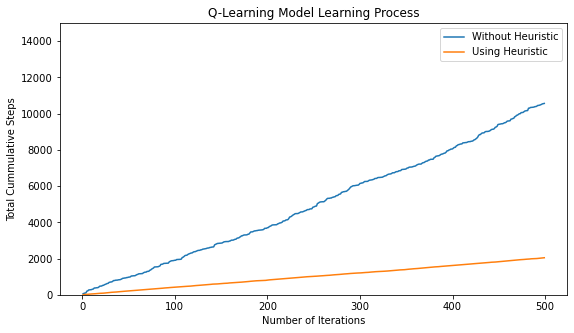

In [38]:
plt.figure(figsize = (20,5))
plt.subplot(1,2,1)
plt.ylim(0,15000)
plt.plot(range(1,500),learning_step_bi, label = 'Without Heuristic')
plt.plot(range(1,500),Learning_step_ai, label = 'Using Heuristic')
plt.title('Q-Learning Model Learning Process')
plt.xlabel('Number of Iterations')
plt.ylabel('Total Cummulative Steps')
plt.legend()
plt.show()

# Visualising total rewards for an agent 
## simple Q-learning algorithm Vs Q-learning algorithm with a heuristic function

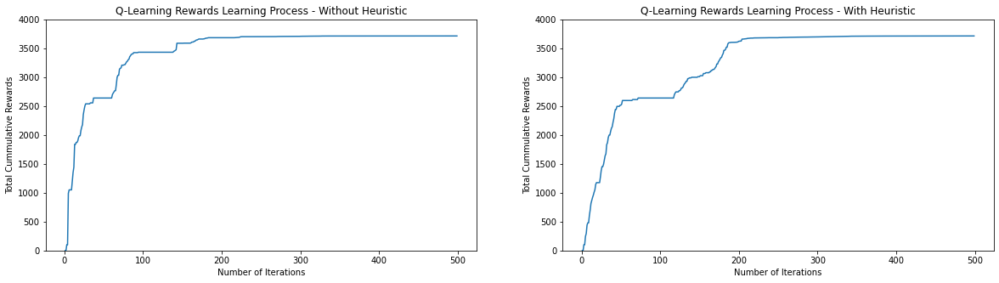

In [39]:
plt.figure(figsize = (20,5))
plt.subplot(1,2,1)
plt.ylim(0,4000)
plt.plot(range(1,500),rewards_curve_bi)
plt.title('Q-Learning Rewards Learning Process - Without Heuristic')
plt.xlabel('Number of Iterations')
plt.ylabel('Total Cummulative Rewards')

plt.subplot(1,2,2)
plt.ylim(0,4000)
plt.plot(range(1,500),rewards_curve_ai)
plt.title('Q-Learning Rewards Learning Process - With Heuristic')
plt.xlabel('Number of Iterations')
plt.ylabel('Total Cummulative Rewards')

plt.show()

## Deploying the agent

In [40]:
def deploy_agent(init_state,q_table):
    print("start state:", init_state)
    state = init_state
    steps = 0
    while True:
        steps = steps + 1
        action = np.argmax(q_table[state,:])
        print(action)
        state = action
        if action == 5:
            print('Goal Reached!')
            return steps

## Testing the Agent

In [41]:
Start_state = 6
steps = deploy_agent(Start_state,q_matrix)
print("Number of Steps took by Agent to reach Goal:",steps)

start state: 6
2
3
1
5
Goal Reached!
Number of Steps took by Agent to reach Goal: 4


## Evaluation Metrics for Q-Learning Model
- Updated Q-Table 
    - Initally Q table is Initialied with zeroes, once the training is completed, Q-Table is updated with the Maximum rewards for the each state, action pair which helps the agent to choose the best action in that particular state
- Rewards Learning
    - For each episode , reward is calculated and updated Q-Table and the reward learning progress graph is shown above.
- Total Number of Timesteps for the complete Training process
    - Upon using the Heuristic fuction, the search process computing process is improved and Q-Table is updated with the Maximum rewards with the least number of Timesteps for episode.
- Total Regrets
    - Even upon the successful training, there will always be the chance of regrets for the agent not to choose the optimal path towards the goal. In our Q-learning model even after success training, we can see 1 regret for the state 6 in which agent miss to choose the optimal path and rather used more steps to reach the goal. 

## Conclusion
- Q-Learning Model using Heuristic function outperfom the Simple Q-Learning Model intems of performance. 
- We can see the huge reduction of total number of time steps for Q-Learning Model using Heuristic Function.
- Agent learns quickly in Q-Learning Model using Heuristic 